# Intraday Data - Introduction

This notebook introduces AlgoSeek's intraday datasets and explores some of the variables in their proprietary TAQ Minute Bar format.

In [2]:
# import awswrangler as wr
import boto3
import pandas as pd
import numpy as np 
from tqdm import tqdm
import os
pd.set_option('display.max_columns',1000)
pd.set_option('display.max_rows',1000)
from math import pi
import pandas_ta as ta
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import spearmanr
from datetime import date, time

In [3]:
from bokeh.plotting import figure,show
from bokeh.models import ColumnDataSource, CDSView, BooleanFilter,HoverTool,FactorRange
from bokeh.transform import factor_cmap, cumsum
from bokeh.layouts import row, column, gridplot
from bokeh.models.widgets import Tabs,Panel
from bokeh.io import output_notebook

ImportError: cannot import name 'TypeGuard' from 'typing_extensions' (C:\Users\julia\Anaconda3\lib\site-packages\typing_extensions.py)

In [ ]:
output_notebook()

# Dataset Intro

| id  | Field                   | Q/T  | Type                          |  No Value | Description                                                                                                                                                                                                         |
|:---:|:------------------------|:----:|:------------------------------|:---------:|:--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------|
| 1  | `Date`                   |      | YYYYMMDD                      | Never     | Trade Date                                                                                                                                                                                                          |
| 2  | `Ticker`                 |      | String                       | Never      | Ticker Symbol                                                                                                                                                                                                       |
| 3  | `TimeBarStart`           |      | HHMM <br>HHMMSS <br>HHMMSSMMM | Never     | For minute bars: HHMM. <br>For second bars: HHMMSS. <br>Examples<br>- One second bar 130302 is from time greater than 130301 to 130302.<br>- One minute bar 1104 is from time greater than 1103 to 1104. |
| 4  | `OpenBarTime`            | Q    | HHMMSSMMM                    | Never      | Open Time of the Bar, for example one minute:<br>11:03:00.000                                                                                                                                                       |
| 5  | `OpenBidPrice`           | Q    | Number                        | Never     | NBBO Bid Price as of bar Open                                                                                                                                                                                       |
| 6  | `OpenBidSize`            | Q    | Number                        | Never     | Total Size from all Exchanges with<br>OpenBidPrice                                                                                                                                                                  |
| 7  | `OpenAskPrice`           | Q    | Number                        | Never     | NBBO Ask Price as of bar Open                                                                                                                                                                                       |
| 8  | `OpenAskSize`            | Q    | Number                        | Never     | Total Size from all Exchange with<br>OpenAskPrice                                                                                                                                                                   |
| 9  | `FirstTradeTime`         | T    | HHMMSSMMM                     | Blank     | Time of first Trade                                                                                                                                                                                                 |
| 10 | `FirstTradePrice`        | T    | Number                        | Blank     | Price of first Trade                                                                                                                                                                                                |
| 11 | `FirstTradeSize`         | T    | Number                        | Blank     | Number of shares of first trade                                                                                                                                                                                     |
| 12 | `HighBidTime`            | Q    | HHMMSSMMM                     | Never     | Time of highest NBBO Bid Price                                                                                                                                                                                      |
| 13 | `HighBidPrice`           | Q    | Number                        | Never     | Highest NBBO Bid Price                                                                                                                                                                                              |
| 14 | `HighBidSize`            | Q    | Number                        | Never     | Total Size from all Exchanges with HighBidPrice                                                                                                                                                                  |
| 15 | `AskPriceAtHighBidPrice` | Q    | Number                        | Never     | Ask Price at time of Highest Bid Price                                                                                                                                                                              |
| 16 | `AskSizeAtHighBidPrice`  | Q    | Number                        | Never     | Total Size from all Exchanges with `AskPriceAtHighBidPrice`                                                                                                                                                        |
| 17 | `HighTradeTime`          | T    | HHMMSSMMM                     | Blank     | Time of Highest Trade                                                                                                                                                                                               |
| 18 | `HighTradePrice`         | T    | Number                        | Blank     | Price of highest Trade                                                                                                                                                                                              |
| 19 | `HighTradeSize`          | T    | Number                        | Blank     | Number of shares of highest trade                                                                                                                                                                                   |
| 20 | `LowBidTime`             | Q    | HHMMSSMMM                     | Never     | Time of lowest Bid                                                                                                                                                                                                  |
| 21 | `LowBidPrice`            | Q    | Number                        | Never     | Lowest NBBO Bid price of bar.                                                                                                                                                                                       |
| 22 | `LowBidSize`             | Q    | Number                        | Never     | Total Size from all Exchanges with `LowBidPrice`                                                                                                                                                                   |
| 23 | `AskPriceAtLowBidPrice`  | Q    | Number                        | Never     | Ask Price at lowest Bid price                                                                                                                                                                                       |
| 24  | `AskSizeAtLowBidPrice`  | Q    | Number                        | Never     | Total Size from all Exchanges with `AskPriceAtLowBidPrice`                                                                                                                                                                                       |
| 25  | `LowTradeTime`          | T    | HHMMSSMMM                     | Blank     | Time of lowest Trade                                                                                                                                                                                                                             |
| 26  | `LowTradePrice`         | T    | Number                        | Blank     | Price of lowest Trade                                                                                                                                                                                                                            |
| 27  | `LowTradeSize`          | T    | Number                        | Blank     | Number of shares of lowest trade                                                                                                                                                                                                                 |
| 28  | `CloseBarTime`          | Q    | HHMMSSMMM                     | Never     | Close Time of the Bar, for example one minute: 11:03:59.999                                                                                                                                                                                      |
| 29  | `CloseBidPrice`         | Q    | Number                        | Never     | NBBO Bid Price at bar Close                                                                                                                                                                                                                      |
| 30  | `CloseBidSize`          | Q    | Number                        | Never     | Total Size from all Exchange with `CloseBidPrice`                                                                                                                                                                                                |
| 31  | `CloseAskPrice`         | Q    | Number                        | Never     | NBBO Ask Price at bar Close                                                                                                                                                                                                                      |
| 32  | `CloseAskSize`          | Q    | Number                        | Never     | Total Size from all Exchange with `CloseAskPrice`                                                                                                                                                                                                |
| 33  | `LastTradeTime`         | T    | HHMMSSMMM                     | Blank     | Time of last Trade                                                                                                                                                                                                                               |
| 34  | `LastTradePrice`        | T    | Number                        | Blank     | Price of last Trade                                                                                                                                                                                                                              |
| 35  | `LastTradeSize`         | T    | Number                        | Blank     | Number of shares of last trade                                                                                                                                                                                                                   |
| 36  | `MinSpread`             | Q    | Number                        | Never     | Minimum Bid-Ask spread size. This may be 0 if the market was crossed during the bar.<br/>If negative spread due to back quote, make it 0.                                                                                                            |
| 37  | `MaxSpread`             | Q    | Number                        | Never     | Maximum Bid-Ask spread in bar                                                                                                                                                                                                                    |
| 38  | `CancelSize`            | T    | Number                        | 0         | Total shares canceled. Default=blank                                                                                                                                                                                                             |
| 39  | `VolumeWeightPrice`     | T    | Number                        | Blank     | Trade Volume weighted average price <br>Sum((`Trade1Shares`*`Price`)+(`Trade2Shares`*`Price`)+…)/`TotalShares`. <br>Note: Blank if no trades.                                                                                                        |
| 40  | `NBBOQuoteCount`        | Q    | Number                        | 0         | Number of Bid and Ask NNBO quotes during bar period.
| 41  | `TradeAtBid`            | Q,T  | Number                        | 0         | Sum of trade volume that occurred at or below the bid (a trade reported/printed late can be below current bid).                                                                                                                                  |
| 42  | `TradeAtBidMid`         | Q,T  | Number                        | 0         | Sum of trade volume that occurred between the bid and the mid-point:<br/>(Trade Price > NBBO Bid ) & (Trade Price < NBBO Mid )                                                                                                                       |
| 43  | `TradeAtMid`            | Q,T  | Number                        | 0         | Sum of trade volume that occurred at mid.<br/>TradePrice = NBBO MidPoint                                                                                                                                                                             |
| 44  | `TradeAtMidAsk`         | Q,T  | Number                        | 0         | Sum of ask volume that occurred between the mid and ask:<br/>(Trade Price > NBBO Mid) & (Trade Price < NBBO Ask)                                                                                                                                     |
| 45  | `TradeAtAsk`            | Q,T  | Number                        | 0         | Sum of trade volume that occurred at or above the Ask.                                                                                                                                                                                           |
| 46  | `TradeAtCrossOrLocked`  | Q,T  | Number                        | 0         | Sum of trade volume for bar when national best bid/offer is locked or crossed. <br>Locked is Bid = Ask <br>Crossed is Bid > Ask                                                                                                                  |
| 47  | `Volume`                | T    | Number                        | 0         | Total number of shares traded                                                                                                                                                                                                                    |
| 48  | `TotalTrades`           | T    | Number                        | 0         | Total number of trades                                                                                                                                                                                                                           |
| 49  | `FinraVolume`           | T    | Number                        | 0         | Number of shares traded that are reported by FINRA. <br/>Trades reported by FINRA are from broker-dealer internalization, dark pools, Over-The-Counter, etc. <br/>FINRA trades represent volume that is hidden or not public available to trade.         |
| 50  | `UptickVolume`          | T    | Integer                       | 0         | Total number of shares traded with upticks during bar.<br/>An uptick = ( trade price > last trade price )                                                                                                                                                                                                                               |
| 51  | `DowntickVolume`        | T    | Integer                       | 0         | Total number of shares traded with downticks during bar.<br/>A downtick = ( trade price < last trade price )                                                                                                                                                                                                                            |
| 52  | `RepeatUptickVolume`    | T    | Integer                       | 0         | Total number of shares where trade price is the same (repeated) and last price change was up during bar. <br/>Repeat uptick = ( trade price == last trade price ) & (last tick direction == up )                                                                                                                                         |
| 53  | `RepeatDowntickVolume`  | T    | Integer                       | 0         | Total number of shares where trade price is the same (repeated) and last price change was down during bar. <br/>Repeat downtick = ( trade price == last trade price ) & (last tick direction == down )                                                                                                                                   |
| 54  | `UnknownVolume`         | T    | Integer                       | 0         | When the first trade of the day takes place, the tick direction is “unknown” as there is no previous Trade to compare it to.<br/>This field is the volume of the first trade after 4am and acts as an initiation value for the tick volume directions.<br/>In future this bar will be renamed to `UnkownTickDirectionVolume` .  |

## Intraday Dataset

In this notebook, we will be using data from Apple, Amazon, and Google. If this is too much data for your machine, choose a subset of these and retry.

In [4]:
df = []
aapl = pd.read_parquet('data/us_equity/taq_min/AAPL.parquet')
df.append(aapl)
amzn = pd.read_parquet('data/us_equity/taq_min/AMZN.parquet')
df.append(amzn)
goog = pd.read_parquet('data/us_equity/taq_min/GOOG.parquet')
df.append(goog)

In [ ]:
df = pd.concat(df) # Combine stocks into a single dataframe

In [5]:
df.head()

,timebarstart,openbartime,openbidprice,openbidsize,openaskprice,openasksize,firsttradetime,firsttradeprice,firsttradesize,highbidtime,highbidprice,highbidsize,highasktime,highaskprice,highasksize,hightradetime,hightradeprice,hightradesize,lowbidtime,lowbidprice,lowbidsize,lowasktime,lowaskprice,lowasksize,lowtradetime,lowtradeprice,lowtradesize,closebartime,closebidprice,closebidsize,closeaskprice,closeasksize,lasttradetime,lasttradeprice,lasttradesize,minspread,maxspread,cancelsize,volumeweightprice,nbboquotecount,tradeatbid,tradeatbidmid,tradeatmid,tradeatmidask,tradeatask,tradeatcrossorlocked,volume,totaltrades,finravolume,finravolumeweightprice,uptickvolume,downtickvolume,repeatuptickvolume,repeatdowntickvolume,unknowntickvolume,tradetomidvolweight,tradetomidvolweightrelative,timeweightbid,timeweightask,datetime,ticker,date
0,04:00,04:00:00.000000000,NaN,NaN,NaN,NaN,04:00:00.066654660,219.90,100.0,04:00:49.358579270,219.8,100.0,04:00:00.067653890,229.65,100.0,04:00:00.066654660,219.90,100.0,04:00:00.067623519,165.00,200.0,04:00:00.070298131,219.96,200.0,04:00:15.699923880,219.89,5.0,04:00:59.999999999,219.80,100.0,219.96,200.0,04:00:58.919973421,219.9,95.0,0.16,12.95,NaN,219.89627,41,0,0,0,219,0,0,319,28,0,NaN,5,5,95,114,100,3.61129,0.13866,219.68699,219.96005,2019-09-24 04:00:00.000,AAPL,2019-09-24
1,04:01,04:01:00.000000000,219.80,100.0,219.96,200.0,04:01:22.811064259,219.80,3.0,04:01:00.000000000,219.8,100.0,04:01:00.000000000,219.96,200.0,04:01:22.811064259,219.80,3.0,04:01:22.811085175,219.66,100.0,04:01:33.142998243,219.90,100.0,04:01:22.811064259,219.80,3.0,04:01:59.999999999,219.66,100.0,219.90,100.0,04:01:22.811075041,219.8,100.0,0.16,0.30,NaN,219.80000,4,103,0,0,0,0,0,103,2,0,NaN,0,3,0,100,0,-8.00000,-0.50000,219.71323,219.93314,2019-09-24 04:01:00.000,AAPL,2019-09-24
2,04:02,04:02:00.000000000,219.66,100.0,219.90,100.0,NaN,NaN,NaN,04:02:53.844936712,219.8,500.0,04:02:00.000000000,219.90,100.0,NaN,NaN,NaN,04:02:00.000000000,219.66,100.0,04:02:00.000000000,219.90,100.0,NaN,NaN,NaN,04:02:59.999999999,219.80,500.0,219.90,100.0,NaN,NaN,NaN,0.10,0.24,NaN,NaN,8,0,0,0,0,0,0,0,0,0,NaN,0,0,0,0,0,NaN,NaN,219.71963,219.90000,2019-09-24 04:02:00.000,AAPL,2019-09-24
3,04:03,04:03:00.000000000,219.80,500.0,219.90,100.0,04:03:02.574526810,219.80,183.0,04:03:00.000000000,219.8,500.0,04:03:00.000000000,219.90,100.0,04:03:19.772355074,219.81,15.0,04:03:00.000000000,219.80,500.0,04:03:00.000000000,219.90,100.0,04:03:02.574526810,219.80,183.0,04:03:59.999999999,219.80,500.0,219.90,100.0,04:03:20.624233236,219.8,68.0,0.10,0.10,NaN,219.80026,6,568,15,0,0,0,0,583,5,0,NaN,15,185,0,383,0,-4.97427,-0.49743,219.80000,219.90000,2019-09-24 04:03:00.000,AAPL,2019-09-24
4,04:04,04:04:00.000000000,219.80,500.0,219.90,100.0,04:04:22.504828693,219.81,100.0,04:04:00.000000000,219.8,500.0,04:04:00.000000000,219.90,100.0,04:04:22.504828693,219.81,100.0,04:04:45.860235192,219.66,100.0,04:04:00.000000000,219.90,100.0,04:04:22.504858574,219.80,200.0,04:04:59.999999999,219.70,500.0,219.90,100.0,04:04:57.129670139,219.8,22.0,0.10,0.24,NaN,219.80575,6,200,300,22,0,0,0,522,5,0,NaN,100,200,200,22,0,-4.21456,-0.42146,219.76972,219.90000,2019-09-24 04:04:00.000,AAPL,2019-09-24


In [6]:
df.dtypes

timebarstart                    object
openbartime                     object
openbidprice                   float64
openbidsize                    float64
openaskprice                   float64
openasksize                    float64
firsttradetime                  object
firsttradeprice                float64
firsttradesize                 float64
highbidtime                     object
highbidprice                   float64
highbidsize                    float64
highasktime                     object
highaskprice                   float64
highasksize                    float64
hightradetime                   object
hightradeprice                 float64
hightradesize                  float64
lowbidtime                      object
lowbidprice                    float64
lowbidsize                     float64
lowasktime                      object
lowaskprice                    float64
lowasksize                     float64
lowtradetime                    object
lowtradeprice            

In [7]:
df['TradeDate'] = pd.to_datetime(aapl['TradeDate'])
df.set_index(['Ticker','BarDatetime'],inplace=True)

In [ ]:
# Convert object dtypes to numeric where appropriate
df=df.astype({'OpenBidPrice': 'float64',
'OpenAskPrice': 'float64',
'FirstTradePrice': 'float64',
'HighBidPrice': 'float64',
'HighAskPrice': 'float64',
'HighTradePrice': 'float64',
'LowBidPrice': 'float64',
'LowAskPrice': 'float64',
'LowTradePrice': 'float64',
'CloseBidPrice': 'float64',
'CloseAskPrice': 'float64',
'LastTradePrice': 'float64',
'MinSpread': 'float64',
'MaxSpread': 'float64',
'VolumeWeightPrice': 'float64',
'FinraVolumeWeightPrice': 'float64',
'TradeToMidVolWeight': 'float64',
'TradeToMidVolWeightRelative': 'float64',
'TimeWeightBid': 'float64',
'TimeWeightAsk': 'float64'})

In [162]:
df.head()

,Date,Ticker,TimeBarStart,OpenBarTime,OpenBidPrice,OpenBidSize,OpenAskPrice,OpenAskSize,FirstTradeTime,FirstTradePrice,FirstTradeSize,HighBidTime,HighBidPrice,HighBidSize,HighAskTime,HighAskPrice,HighAskSize,HighTradeTime,HighTradePrice,HighTradeSize,LowBidTime,LowBidPrice,LowBidSize,LowAskTime,LowAskPrice,LowAskSize,LowTradeTime,LowTradePrice,LowTradeSize,CloseBarTime,CloseBidPrice,CloseBidSize,CloseAskPrice,CloseAskSize,LastTradeTime,LastTradePrice,LastTradeSize,MinSpread,MaxSpread,CancelSize,VolumeWeightPrice,NBBOQuoteCount,TradeAtBid,TradeAtBidMid,TradeAtMid,TradeAtMidAsk,TradeAtAsk,TradeAtCrossOrLocked,Volume,TotalTrades,FinraVolume,FinraVolumeWeightPrice,UptickVolume,DowntickVolume,RepeatUptickVolume,RepeatDowntickVolume,UnknownTickVolume,TradeToMidVolWeight,TradeToMidVolWeightRelative,TimeWeightBid,TimeWeightAsk,Datetime,year,month,day,hour,min,datetime
0,2019-01-02,AAPL,04:00,04:00:00.000000000,NaN,NaN,NaN,NaN,04:00:00.011237902,154.40,260.0,04:00:00.072969379,154.00,100.0,04:00:00.065758669,187.00,1000.0,04:00:00.011237902,154.40,260.0,04:00:00.018616665,125.00,100.0,04:00:12.350569150,153.01,100.0,04:00:12.350550152,153.01,100.0,04:00:59.999999999,153.73,100.0,154.90,100.0,04:00:56.249427390,154.0,300.0,0.01,49.00,NaN,154.05012,64,1310,0,0,150,100,0,3021,35,0,NaN,700,160,300,400,1461,-18.13969,-0.19551,153.38612,154.28035,2022-05-02 04:00:00,2019,1,2,4,0,2019-01-02 04:00:00
1,2019-01-02,AAPL,04:01,04:01:00.000000000,153.73,100.0,154.90,100.0,04:01:50.226818320,154.00,100.0,04:01:48.731158057,154.00,100.0,04:01:00.000000000,154.90,100.0,04:01:50.226818320,154.00,100.0,04:01:00.000000000,153.73,100.0,04:01:50.566574469,154.00,100.0,04:01:50.226818320,154.00,100.0,04:01:59.999999999,153.77,100.0,154.90,100.0,04:01:50.226913490,154.0,10.0,0.23,1.17,NaN,154.00000,10,100,10,0,0,0,0,110,2,0,NaN,0,0,110,0,0,-43.95455,-0.48150,153.75690,154.89586,2022-05-02 04:01:00,2019,1,2,4,1,2019-01-02 04:01:00
2,2019-01-02,AAPL,04:02,04:02:00.000000000,153.77,100.0,154.90,100.0,04:02:12.646905859,153.80,10.0,04:02:23.466309062,154.00,100.0,04:02:00.000000000,154.90,100.0,04:02:12.646905859,153.80,10.0,04:02:00.000000000,153.77,100.0,04:02:13.841983267,154.88,200.0,04:02:12.646905859,153.80,10.0,04:02:59.999999999,154.00,1100.0,154.88,200.0,04:02:12.646905859,153.8,10.0,0.88,1.13,NaN,153.80000,8,10,0,0,0,0,0,10,1,0,NaN,0,10,0,0,0,-55.00000,-0.50000,153.91998,154.88461,2022-05-02 04:02:00,2019,1,2,4,2,2019-01-02 04:02:00
3,2019-01-02,AAPL,04:03,04:03:00.000000000,154.00,1100.0,154.88,200.0,04:03:26.478497202,154.01,100.0,04:03:24.999530046,154.01,100.0,04:03:00.000000000,154.88,200.0,04:03:26.478497202,154.01,100.0,04:03:00.000000000,154.00,1100.0,04:03:26.478493621,154.01,100.0,04:03:26.527446086,154.00,100.0,04:03:59.999999999,154.00,1100.0,154.88,200.0,04:03:26.527446086,154.0,100.0,0.01,0.88,NaN,154.00500,14,100,0,0,0,100,0,200,2,0,NaN,100,100,0,0,0,-12.25000,0.00000,154.00025,154.82013,2022-05-02 04:03:00,2019,1,2,4,3,2019-01-02 04:03:00
4,2019-01-02,AAPL,04:04,04:04:00.000000000,154.00,1100.0,154.88,200.0,04:04:18.530925273,154.00,437.0,04:04:45.946547717,154.11,100.0,04:04:00.000000000,154.88,200.0,04:04:18.530925273,154.00,437.0,04:04:00.000000000,154.00,1100.0,04:04:01.134263995,154.35,100.0,04:04:18.530925273,154.00,437.0,04:04:59.999999999,154.00,600.0,154.35,100.0,04:04:22.027551739,154.0,35.0,0.24,0.88,NaN,154.00000,8,472,0,0,0,0,0,472,2,0,NaN,0,0,0,472,0,-17.50000,-0.50000,154.01389,154.36002,2022-05-02 04:04:00,2019,1,2,4,4,2019-01-02 04:04:00


Set date and time indicators

In [153]:
df['year']=(df.index.get_level_values('BarDateTime').year)
df['month']=(df.index.get_level_values('BarDateTime').month)
df['quarter']=(df.index.get_level_values('BarDateTime').quarter)
df['week']=(df.index.get_level_values('BarDateTime').week)
df['day']=(df.index.get_level_values('BarDateTime').day)


In [ ]:
df.head(100)

## Intraday Dataset EDA

Import charting libraries

In [ ]:
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
import matplotlib.pyplot as plt


### Plotting Trade Data

#### Trades

#### Quotes

## Intraday Feature Engineering

Create groupby and empty dataframes to calculate indicators

In [ ]:
# Inital code - for a whole month of the nasdaq 100
by_ticker = df.sort_index().groupby('Ticker', group_keys=False)
by_ticker_date = df.sort_index().groupby(['Ticker', 'BarDateTime'])
data = pd.DataFrame(index=df.index)


In [22]:
data['date'] = (df.index.get_level_values('Ticker').date)
data['date'] = pd.factorize(df['date'], sort=True)[0]
data['minute'] = pd.to_timedelta(data.index.get_level_values('BarDateTime').time.astype(str))
data.minute = (data.minute.dt.seconds.sub(data.minute.dt.seconds.min()).div(60).astype(int))
data[f'ret1min'] = df['LastTradePrice'].div(df['FirstTradePrice']).sub(1)


In [23]:
for t in tqdm(range(2, 11)):
    data[f'ret{t}min'] = df['LastTradePrice'].div(df['FirstTradePrice'].shift(t-1)).sub(1)

100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:00<00:00, 51.88it/s]


In [60]:
data['fwd1min'] = (data
                   .sort_index()
                   .ret1min
                   .shift(-1))

In [219]:
data['MFI'] = (by_ticker.apply(lambda x: ta.mfi(x['HighTradePrice'],
                                          x['LowTradePrice'],
                                          x['LastTradePrice'],
                                          x.Volume,
                                          length=14)))

In [ ]:
data['MFI'] = (aapl.apply(lambda x: ta.mfi(x['HighTradePrice'],
                                          x['LowTradePrice'],
                                          x['LastTradePrice'],
                                          x.Volume,
                                          length=14)))

In [24]:
# Single Stock
# data['mfi']=ta.mfi(aapl['HighTradePrice'],aapl['LowTradePrice'],aapl['CloseTradePrice'],aapl.volume,length=14)

In [221]:
data['BOP'] = (by_ticker.apply(lambda x: ta.bop(x['FirstTradePrice'], x["HighTradePrice"],x['LowTradePrice'],x['LastTradePrice'])))


In [25]:
# Single Stock
# data['bop']=ta.bop(aapl.firsttradeprice,aapl.hightradeprice,aapl.lowtradeprice,aapl.lasttradeprice)

In [222]:
data['CCI'] = (by_ticker.apply(lambda x: ta.cci(x['HighTradePrice'],
                                          x['LowTradePrice'],
                                          x['LastTradePrice'],
                                          timeperiod=14)))

In [26]:
# Single Stock
# data['cci'] = ta.cci(aapl.hightradeprice,aapl.lowtradeprice,aapl.lasttradeprice,timeperiod=14)

In [40]:
data['NATR'] = by_ticker.apply(lambda x: ta.natr(x['HighTradePrice'].ffill(), x['LowTradePrice'].ffill(), x['LastTradePrice'].ffill()))

NameError: name 'by_ticker' is not defined

In [41]:
# Single Stock
# data['natr'] = ta.natr(aapl.hightradeprice,aapl.lowtradeprice,aapl.lasttradeprice)

In [29]:
for f in ['uptickvolume', 'downtickvolume', 'repeatuptickvolume', 'repeatdowntickvolume']:
    data[f] = df.loc[:, f].div(df.Volume).replace(np.inf, np.nan)

In [239]:
data['trades_bid_ask'] = df['TradeAtAsk'].sub(df['TradeAtBid']).div(df.Volume).replace((np.inf, -np.inf), np.nan)


In [30]:
data.info(null_counts=True)

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1206563 entries, 2018-01-02 04:00:00 to 2021-12-31 19:59:00
Data columns (total 20 columns):
 #   Column                Non-Null Count    Dtype  
---  ------                --------------    -----  
 0   date                  1206563 non-null  int64  
 1   minute                1206563 non-null  int32  
 2   ret1min               1060098 non-null  float64
 3   ret2min               1017058 non-null  float64
 4   ret3min               997715 non-null   float64
 5   ret4min               996599 non-null   float64
 6   ret5min               995740 non-null   float64
 7   ret6min               995297 non-null   float64
 8   ret7min               994846 non-null   float64
 9   ret8min               994588 non-null   float64
 10  ret9min               994341 non-null   float64
 11  ret10min              994241 non-null   float64
 12  mfi                   1206549 non-null  float64
 13  bop                   1060098 non-null  float64
 14  c

C:\Users\julia\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: null_counts is deprecated. Use show_counts instead
  """Entry point for launching an IPython kernel.


### SMA

In [87]:
# SMA 5
data['sma5'] = ta.sma(df.LastTradePrice,length=5)
# SMA 10
data['sma10'] = ta.sma(df.LastTradePrice,length=10)
# SMA 15
data['sma15'] = ta.sma(df.LastTradePrice,length=15)
# SMA 20 
data['sma20'] = ta.sma(df.LastTradePrice,length=20)
# SMA 25
data['sma25'] = ta.sma(df.LastTradePrice,length=25)

In [92]:
data['sma5']= aapl['lasttradeprice'].rolling(window=5).mean()
data['sma10']= aapl['lasttradeprice'].rolling(window=10).mean()
data['sma15']= aapl['lasttradeprice'].rolling(window=15).mean()
data['sma20']= aapl['lasttradeprice'].rolling(window=20).mean()
data['sma25']= aapl['lasttradeprice'].rolling(window=25).mean()

### EMA

In [34]:
# EMA 5
data['ema5'] = ta.ema(aapl.lasttradeprice,length=5)
# ema 10
data['ema10'] = ta.ema(aapl.lasttradeprice,length=10)
# ema 15
data['ema15'] = ta.ema(aapl.lasttradeprice,length=15)
# ema 20 
data['ema20'] = ta.ema(aapl.lasttradeprice,length=20)
# ema 25
data['ema25'] = ta.ema(aapl.lasttradeprice,length=25)

In [93]:
data['ema5']= aapl['lasttradeprice'].ewm(span=5,adjust=False).mean()
data['ema10']= aapl['lasttradeprice'].ewm(span=10,adjust=False).mean()
data['ema15']= aapl['lasttradeprice'].ewm(span=15,adjust=False).mean()
data['ema20']= aapl['lasttradeprice'].ewm(span=20,adjust=False).mean()
data['ema25']= aapl['lasttradeprice'].ewm(span=25,adjust=False).mean()

### CMF

In [42]:
data['cmf'] = ta.cmf(aapl['hightradeprice'],aapl['lowtradeprice'],aapl['lasttradeprice'],aapl['volume'])

### MACD

In [44]:
data['macd'], data['macd_hist'], data['macd_signal'] = ta.macd(aapl.lasttradeprice)

### VWAP

In [38]:
data['vwap'] = ta.vwap(aapl['hightradeprice'],aapl['lowtradeprice'],aapl['lasttradeprice'],aapl['volume'])

### BBands

In [45]:
data['bbands_lower'],data['bbands_mid'], data['bbands_upper'], data['bbands_bandwidth'], data['bbands_percent'] = ta.bbands(aapl.lasttradeprice)

### OBV

In [46]:
data['obv'] = ta.obv(aapl.lasttradeprice,aapl.volume)

### Entropy

In [47]:
data['entropy'] = ta.entropy(aapl.lasttradeprice)

### Z Score

In [48]:
data['z_score'] = ta.zscore(aapl.lasttradeprice)

### Percent Return

In [49]:
data['pct_ret'] = ta.percent_return(aapl.lasttradeprice)

In [84]:
data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1206563 entries, 2018-01-02 04:00:00 to 2021-12-31 19:59:00
Data columns (total 45 columns):
 #   Column                Non-Null Count    Dtype  
---  ------                --------------    -----  
 0   date                  1206563 non-null  int64  
 1   minute                1206563 non-null  int32  
 2   ret1min               1060098 non-null  float64
 3   ret2min               1017058 non-null  float64
 4   ret3min               997715 non-null   float64
 5   ret4min               996599 non-null   float64
 6   ret5min               995740 non-null   float64
 7   ret6min               995297 non-null   float64
 8   ret7min               994846 non-null   float64
 9   ret8min               994588 non-null   float64
 10  ret9min               994341 non-null   float64
 11  ret10min              994241 non-null   float64
 12  mfi                   1206549 non-null  float64
 13  bop                   1060098 non-null  float64
 14  c

In [56]:
features = ['ret1min', 'ret2min', 'ret3min', 'ret4min', 'ret5min', 
            'ret6min', 'ret7min', 'ret8min', 'ret9min', 'ret10min',
            'repeatuptickvolume', 'uptickvolume', 'downtickvolume', 'repeatdowntickvolume', 'bop', 'cci', 'mfi', 
            'sma5','sma10','sma15','sma20','sma25','ema5','ema10','ema15','ema20','ema25','vwap','cmf','obv','pct_ret']

In [94]:
sample = data.sample(n=100000)


IndexError: index 21 is out of bounds for axis 0 with size 21

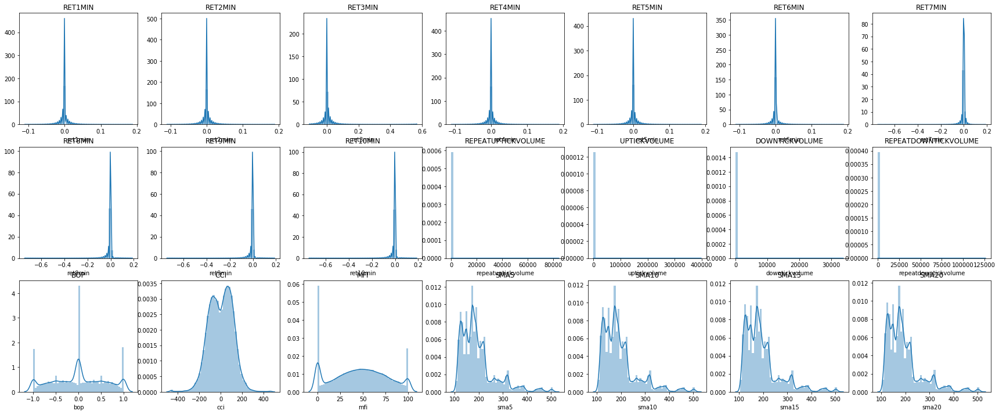

In [95]:
fig, axes = plt.subplots(nrows=3, ncols=7, figsize=(30, 12))
axes = axes.flatten()

for i, feature in enumerate(features):
    sns.distplot(sample[feature], ax=axes[i])
    axes[i].set_title(feature.upper())
    
sns.despine()
fig.tight_layout()

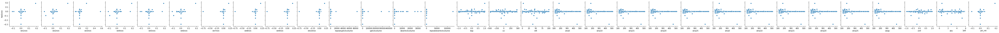

In [96]:
sns.pairplot(sample, y_vars=['fwd1min'], x_vars=features);


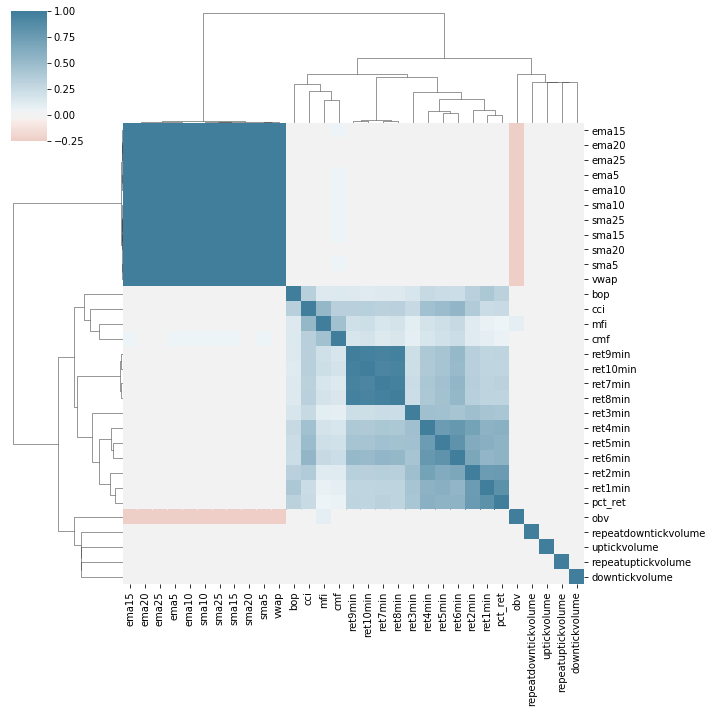

In [97]:
corr = sample.loc[:, features].corr()
sns.clustermap(corr, cmap = sns.diverging_palette(20, 230, as_cmap=True),center=0, vmin=-.25)

In [80]:
corr

,ret1min,ret2min,ret3min,ret4min,ret5min,ret6min,ret7min,ret8min,ret9min,ret10min,repeatuptickvolume,uptickvolume,downtickvolume,repeatdowntickvolume,bop,cci,mfi,sma5,sma10,sma15,sma20,sma25,ema5,ema10,ema15,ema20,ema25,vwap,cmf,obv,pct_ret
ret1min,1.000000,0.432102,0.351108,0.150793,0.143496,0.144547,0.139372,0.137959,0.131163,0.132508,0.000429,0.004527,-0.001292,0.002291,0.335580,0.137819,0.058736,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.006740,0.053720,-0.002807,0.085947
ret2min,0.432102,1.000000,0.766651,0.329682,0.319574,0.315246,0.307025,0.302779,0.294257,0.291476,0.000048,0.004396,-0.006157,0.000326,0.399103,0.409173,0.155473,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.003710,0.126799,-0.005849,0.119621
ret3min,0.351108,0.766651,1.000000,0.430227,0.413821,0.405632,0.394863,0.388708,0.378976,0.374672,0.001783,0.003900,-0.002328,0.001718,0.325673,0.474931,0.196875,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.006493,0.153691,-0.003756,0.098083
ret4min,0.150793,0.329682,0.430227,1.000000,0.959130,0.935358,0.914885,0.899457,0.883215,0.867119,0.000205,0.001351,-0.001016,-0.001815,0.138014,0.245080,0.108817,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.005435,0.086909,-0.003134,0.042024
ret5min,0.143496,0.319574,0.413821,0.959130,1.000000,0.966482,0.943811,0.927732,0.911450,0.893684,0.000403,0.001603,-0.000906,0.000144,0.135062,0.275536,0.131267,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.007926,0.103741,-0.003159,0.039497
ret6min,0.144547,0.315246,0.405632,0.935358,0.966482,1.000000,0.961227,0.944298,0.927114,0.909063,0.000714,0.002033,-0.000420,-0.000134,0.132389,0.297221,0.151643,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.006606,0.119385,-0.002956,0.040033
ret7min,0.139372,0.307025,0.394863,0.914885,0.943811,0.961227,1.000000,0.964911,0.944558,0.926929,0.000174,0.000943,-0.000194,-0.000260,0.127979,0.312457,0.171423,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.005835,0.134717,-0.002108,0.038499
ret8min,0.137959,0.302779,0.388708,0.899457,0.927732,0.944298,0.964911,1.000000,0.969056,0.947175,0.000151,0.000727,-0.000313,0.000117,0.126844,0.327110,0.193336,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.006347,0.150538,-0.002234,0.038189
ret9min,0.131163,0.294257,0.378976,0.883215,0.911450,0.927114,0.944558,0.969056,1.000000,0.965767,-0.000052,0.001126,-0.000507,0.000086,0.124346,0.336263,0.211922,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.005814,0.165646,-0.002871,0.036010
ret10min,0.132508,0.291476,0.374672,0.867119,0.893684,0.909063,0.926929,0.947175,0.965767,1.000000,-0.000302,0.001338,-0.000562,0.000084,0.121667,0.341023,0.230891,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.005943,0.178653,-0.002078,0.036300


In [98]:
ic = {}
for feature in tqdm(features):
    d = data[['fwd1min', feature]].dropna()
    by_day = d.groupby(d.index.get_level_values('datetime').date) # calc per min is very time-consuming
    ic[feature] = by_day.apply(lambda x: spearmanr(x.fwd1min, x[feature])[0]).mean()
ic = pd.Series(ic)

100%|██████████████████████████████████████████████████████████████████████████████████| 31/31 [01:10<00:00,  2.27s/it]


In [100]:
ic.sort_index()

bop                     0.132928
cci                     0.047488
cmf                     0.003139
downtickvolume         -0.024647
ema10                  -0.045198
ema15                  -0.045204
ema20                  -0.044945
ema25                  -0.044652
ema5                   -0.043726
mfi                     0.016407
obv                    -0.025346
pct_ret                 0.154638
repeatdowntickvolume   -0.042426
repeatuptickvolume      0.048552
ret10min                0.039471
ret1min                 0.138452
ret2min                 0.084531
ret3min                 0.078517
ret4min                 0.063823
ret5min                 0.061033
ret6min                 0.053717
ret7min                 0.051614
ret8min                 0.046192
ret9min                 0.043531
sma10                  -0.056317
sma15                  -0.056655
sma20                  -0.056855
sma25                  -0.056571
sma5                   -0.053318
uptickvolume            0.032169
vwap      

NameError: name 'FuncFormatter' is not defined

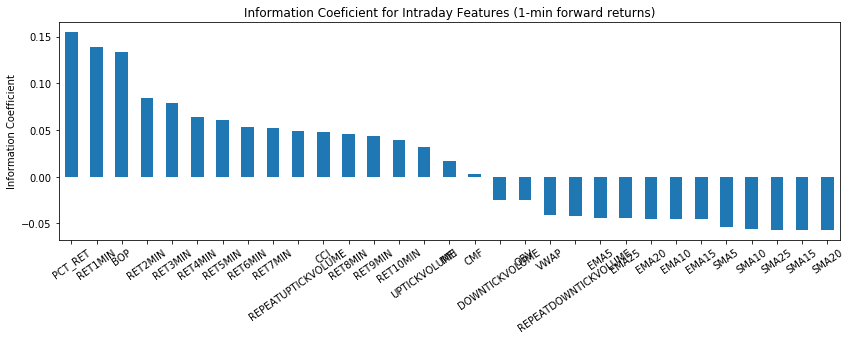

In [101]:
title = 'Information Coeficient for Intraday Features (1-min forward returns)'
ic.index = ic.index.map(str.upper)
ax = ic.sort_values(ascending=False).plot.bar(figsize=(14, 4), title=title, rot=35)
ax.set_ylabel('Information Coefficient')
ax.yaxis.set_major_formatter(FuncFormatter(lambda y, _: '{:.1%}'.format(y))) 
sns.despine()
plt.tight_layout();

In [374]:
df=data20[data20.index.get_level_values('Ticker')=="MSFT"]

In [90]:
data['sma5']

datetime
2018-01-02 04:00:00          NaN
2018-01-02 04:00:00          NaN
2018-01-02 04:01:00          NaN
2018-01-02 04:01:00          NaN
2018-01-02 04:02:00          NaN
                         ...    
2021-12-31 19:55:00    177.72400
2021-12-31 19:56:00    177.72002
2021-12-31 19:57:00    177.72002
2021-12-31 19:58:00    177.71602
2021-12-31 19:59:00    177.71402
Name: sma5, Length: 1206563, dtype: float64

In [91]:
data.isna().sum()

date                          0
minute                        0
ret1min                  146465
ret2min                  189505
ret3min                  208848
ret4min                  209964
ret5min                  210823
ret6min                  211266
ret7min                  211717
ret8min                  211975
ret9min                  212222
ret10min                 212322
mfi                          14
bop                      146465
cci                      339388
natr                    1206563
uptickvolume             174181
downtickvolume           174181
repeatuptickvolume       174181
repeatdowntickvolume     174181
sma5                     263251
sma10                   1206563
sma15                   1206563
sma20                   1206563
sma25                   1206563
ema5                    1206563
ema10                   1206563
ema15                   1206563
ema20                   1206563
ema25                   1206563
vwap                     146465
cmf     

In [178]:
w = 12*60*60*1000 # half day in ms

inc = df['LastTradePrice'] > df['FirstTradePrice']
dec = df['FirstTradePrice'] > df['LastTradePrice']

TOOLS = "pan,wheel_zoom,box_zoom,reset,save"

p = figure(x_axis_type="datetime", tools=TOOLS, width=1000, title = "MSFT Candlestick")
p.xaxis.major_label_orientation = pi/4
p.grid.grid_line_alpha=0.3

p.segment(df.Date, df['HighTradePrice'], df.Date, df['LowTradePrice'], color="black")
p.vbar(df.Date[inc], w, df['FirstTradePrice'][inc], df['LastTradePrice'][inc], fill_color="#D5E1DD", line_color="black")
p.vbar(df.Date[dec], w, df['FirstTradePrice'][dec], df['LastTradePrice'][dec], fill_color="#F2583E", line_color="black")

show(p)

In [375]:
df=df.rename(columns={'FirstTradePrice':'Open','HighTradePrice':'High','LowTradePrice':'Low','LastTradePrice':'Close'})

In [376]:
df['datetime']=df.index.get_level_values('datetime')

In [378]:
df

Date TimeBarStart         OpenBarTime  \
Ticker datetime                                                          
MSFT   2019-01-02 04:00:00 2019-01-02        04:00  04:00:00.000000000   
       2019-01-02 04:01:00 2019-01-02        04:01  04:01:00.000000000   
       2019-01-02 04:02:00 2019-01-02        04:02  04:02:00.000000000   
       2019-01-02 04:03:00 2019-01-02        04:03  04:03:00.000000000   
       2019-01-02 04:04:00 2019-01-02        04:04  04:04:00.000000000   
...                               ...          ...                 ...   
       2019-01-31 19:55:00 2019-01-31        19:55  19:55:00.000000000   
       2019-01-31 19:56:00 2019-01-31        19:56  19:56:00.000000000   
       2019-01-31 19:57:00 2019-01-31        19:57  19:57:00.000000000   
       2019-01-31 19:58:00 2019-01-31        19:58  19:58:00.000000000   
       2019-01-31 19:59:00 2019-01-31        19:59  19:59:00.000000000   

                            OpenBidPrice  OpenBidSize  OpenAskPrice  \
Ticker datetime                                                       
MSFT   2019-01-02 04:00:00           NaN          NaN           NaN   
       2019-01-02 04:01:00         98.94        100.0         99.20   
       2019-01-02 04:02:00         98.90       1100.0         99.19   
       2019-01-02 04:03:00         98.92        100.0         99.19   
       2019-01-02 04:04:00         98.88        100.0         99.19   
...                                  ...          ...           ...   
       2019-01-31 19:55:00        104.55        100.0        104.70   
       2019-01-31 19:56:00        104.75        100.0        104.80   
       2019-01-31 19:57:00        104.66        100.0        104.80   
       2019-01-31 19:58:00        104.55        100.0        104.80   
       2019-01-31 19:59:00        104.55        100.0        104.80   

                            OpenAskSize      FirstTradeTime    Open  \
Ticker datetime                                                       
MSFT   2019-01-02 04:00:00          NaN  04:00:00.016864663   99.40   
       2019-01-02 04:01:00        500.0                None     NaN   
       2019-01-02 04:02:00        100.0                None     NaN   
       2019-01-02 04:03:00        100.0                None     NaN   
       2019-01-02 04:04:00        100.0  04:04:15.737828060   98.88   
...                                 ...                 ...     ...   
       2019-01-31 19:55:00        400.0  19:55:39.748518441  104.70   
       2019-01-31 19:56:00        100.0  19:56:41.275371771  104.75   
       2019-01-31 19:57:00        100.0                None     NaN   
       2019-01-31 19:58:00        100.0  19:58:06.598802217  104.75   
       2019-01-31 19:59:00        100.0  19:59:11.063678734  104.56   

                            FirstTradeSize         HighBidTime  HighBidPrice  \
Ticker datetime                                                                
MSFT   2019-01-02 04:00:00            50.0  04:00:54.173557537         98.94   
       2019-01-02 04:01:00             NaN  04:01:00.000000000         98.94   
       2019-01-02 04:02:00             NaN  04:02:46.032751474         98.93   
       2019-01-02 04:03:00             NaN  04:03:00.000000000         98.92   
       2019-01-02 04:04:00           100.0  04:04:00.000000000         98.88   
...                                    ...                 ...           ...   
       2019-01-31 19:55:00           400.0  19:55:39.748516866        104.75   
       2019-01-31 19:56:00            20.0  19:56:00.000000000        104.75   
       2019-01-31 19:57:00             NaN  19:57:00.000000000        104.66   
       2019-01-31 19:58:00            80.0  19:58:00.000000000        104.55   
       2019-01-31 19:59:00            25.0  19:59:00.000000000        104.55   

                            HighBidSize         HighAskTime  HighAskPrice  \
Ticker datetime                                                             
MSFT   2019-01-02 04:00:00 

In [379]:

source=ColumnDataSource(data=df)
hover = HoverTool(

tooltips=[

    ('', '@Date{%F}'),

    ('O', '@OPEN{"+f"0.00"+" a}'),

    ('H', '@HIGH{"+f"0.00"+" a}'),

    ('L', '@LOW{"+f"0.00"+" a}'),

    ('C', '@CLOSE{"+f"0.00"+" a}'),

    ('V', '@VOLUME{0}'),

],



formatters={

    '@Date': 'datetime'

},

mode='mouse'

)

inc_b = source.data['Close'] >= source.data['Open']

inc = CDSView(source=source, filters=[BooleanFilter(inc_b)])

dec_b = source.data['Open'] > source.data['Close']

dec = CDSView(source=source, filters=[BooleanFilter(dec_b)])

w = 12*60*60*1000

figure3 = figure(title="OHLC Candlestick Chart (IBM.N)",x_axis_type="datetime",sizing_mode="stretch_width",height=400,x_axis_label='Date')

figure3.segment(source=source, x0='datetime', x1='datetime', y0='High', y1='Low', color="black")

figure3.vbar(source=source, view=inc, x='datetime', width=w, top='Open', bottom='Close', fill_color="green", line_color="green")

figure3.vbar(source=source, view=dec, x='datetime', width=w, top='Open', bottom='Close', fill_color="red", line_color="red")

figure3.add_tools(hover)

show(figure3)

In [371]:
import lightgbm as lgb
from time import time
from pathlib import Path

model_path = Path('model/intraday')
if not model_path.exists():
    model_path.mkdir(parents=True)
from utils import format_time


In [306]:
# where we stored the features engineered in the previous notebook
data_store = 'data/algoseek.h5'
# where we'll store the model results
result_store = 'data/intra_day.h5'

In [ ]:
!pip install vectorbt

In [263]:
class MultipleTimeSeriesCV:
    """Generates tuples of train_idx, test_idx pairs
    Assumes the MultiIndex contains levels 'symbol' and 'date'
    purges overlapping outcomes"""

    def __init__(self,
                 n_splits=3,
                 train_period_length=126,
                 test_period_length=21,
                 lookahead=None,
                 date_idx='date',
                 shuffle=False):
        self.n_splits = n_splits
        self.lookahead = lookahead
        self.test_length = test_period_length
        self.train_length = train_period_length
        self.shuffle = shuffle
        self.date_idx = date_idx

    def split(self, X, y=None, groups=None):
        unique_dates = X.index.get_level_values(self.date_idx).unique()
        days = sorted(unique_dates, reverse=True)
        split_idx = []
        for i in range(self.n_splits):
            test_end_idx = i * self.test_length
            test_start_idx = test_end_idx + self.test_length
            train_end_idx = test_start_idx + self.lookahead - 1
            train_start_idx = train_end_idx + self.train_length + self.lookahead - 1
            split_idx.append([train_start_idx, train_end_idx,
                              test_start_idx, test_end_idx])

        dates = X.reset_index()[[self.date_idx]]
        for train_start, train_end, test_start, test_end in split_idx:

            train_idx = dates[(dates[self.date_idx] > days[train_start])
                              & (dates[self.date_idx] <= days[train_end])].index
            test_idx = dates[(dates[self.date_idx] > days[test_start])
                             & (dates[self.date_idx] <= days[test_end])].index
            if self.shuffle:
                np.random.shuffle(list(train_idx))
            yield train_idx.to_numpy(), test_idx.to_numpy()

    def get_n_splits(self, X, y, groups=None):
        return self.n_splits

In [264]:
def get_fi(model):
    fi = model.feature_importance(importance_type='gain')
    return (pd.Series(fi / fi.sum(),
                      index=model.feature_name()))

In [265]:
data['stock_id'] = pd.factorize(data.index.get_level_values('Ticker'), sort=True)[0]

In [266]:
categoricals = ['stock_id']

In [267]:
def ic_lgbm(preds, train_data):
    """Custom IC eval metric for lightgbm"""
    is_higher_better = True
    return 'ic', spearmanr(preds, train_data.get_label())[0], is_higher_better

In [286]:
DAY = 390   # number of minute bars in a trading day of 6.5 hrs (9:30 - 15:59)
MONTH = 21  # trading days
WEEK = 5

In [287]:
def get_cv(n_splits=13):
    return MultipleTimeSeriesCV(n_splits=n_splits,
                                lookahead=1,
                                test_period_length=WEEK * DAY,       # test for 1 week
                                train_period_length=1 * MONTH * DAY,  # train for 1 year
                                date_idx='datetime')

In [288]:
for i, (train_idx, test_idx) in enumerate(get_cv().split(X=data)):
    train_dates = data.iloc[train_idx].index.unique('datetime')
    test_dates = data.iloc[test_idx].index.unique('datetime')
    print(train_dates.min(), train_dates.max(), test_dates.min(), test_dates.max())

2019-01-16 11:11:00 2019-01-29 19:32:00 2019-01-29 19:33:00 2019-01-31 20:00:00
2019-01-14 10:42:00 2019-01-25 19:04:00 2019-01-25 19:05:00 2019-01-29 19:32:00
2019-01-10 10:14:00 2019-01-23 18:36:00 2019-01-23 18:37:00 2019-01-25 19:04:00
2019-01-08 09:45:00 2019-01-18 18:08:00 2019-01-18 18:09:00 2019-01-23 18:36:00
2019-01-04 09:16:00 2019-01-16 17:40:00 2019-01-16 17:41:00 2019-01-18 18:08:00
2019-01-02 08:46:00 2019-01-14 17:11:00 2019-01-14 17:12:00 2019-01-16 17:40:00


IndexError: list index out of range

In [279]:
data20['day']

Ticker  datetime           
AAPL    2019-01-02 04:00:00     2
        2019-01-02 04:01:00     2
        2019-01-02 04:02:00     2
        2019-01-02 04:03:00     2
        2019-01-02 04:04:00     2
                               ..
XRAY    2019-01-31 17:56:00    31
        2019-01-31 17:57:00    31
        2019-01-31 17:58:00    31
        2019-01-31 17:59:00    31
        2019-01-31 18:00:00    31
Name: day, Length: 1850033, dtype: int64

In [289]:
label = sorted(data.filter(like='fwd').columns)
features = data.columns.difference(label).tolist()
label = label[0]

In [298]:
params = dict(objective='regression',
              metric=['rmse'],
              device='cpu',
              max_bin=63,
              gpu_use_dp=False,
              num_leaves=16,
              min_data_in_leaf=500,
              feature_fraction=.8,
              verbose=-1)

In [299]:
num_boost_round = 250

In [300]:
cv = get_cv(n_splits=2) # we have enough data for 2 different test periods

In [301]:
def get_scores(result):
    return pd.DataFrame({'train': result['training']['ic'],
                         'valid': result['valid_1']['ic']})

In [313]:
start = time()
for fold, (train_idx, test_idx) in enumerate(cv.split(X=data), 1):
    # create lgb train set
    train_set = data.iloc[train_idx, :]
    lgb_train = lgb.Dataset(data=train_set.drop(label, axis=1),
                            label=train_set[label],
                            categorical_feature=categoricals)
    
    # create lgb test set
    test_set = data.iloc[test_idx, :]
    lgb_test = lgb.Dataset(data=test_set.drop(label, axis=1),
                           label=test_set[label],
                           categorical_feature=categoricals, 
                           reference=lgb_train)

    # train model
    evals_result = {}
    model = lgb.train(params=params,
                      train_set=lgb_train,
                      valid_sets=[lgb_train, lgb_test],
                      feval=ic_lgbm,
                      num_boost_round=num_boost_round,
                      evals_result=evals_result,
                      verbose_eval=50)
    model.save_model((model_path / f'{fold:02}.txt').as_posix())
    
    # get train/valid ic scores
    scores = get_scores(evals_result)
    scores.to_hdf(result_store, f'ic/{fold:02}')
    
    # get feature importance
    fi = get_fi(model)
    fi.to_hdf(result_store, f'fi/{fold:02}')
    
    # generate validation predictions
    X_test = test_set.loc[:, model.feature_name()]
    y_test = test_set.loc[:, [label]]
    y_test['pred'] = model.predict(X_test)
    y_test.to_hdf(result_store, f'predictions/{fold:02}')
    
    # compute average IC per minute
    by_minute = y_test.groupby(test_set.index.get_level_values('datetime'))
    daily_ic = by_minute.apply(lambda x: spearmanr(x[label], x.pred)[0]).mean()
    print(f'\nFold: {fold:02} | {format_time(time()-start)} | IC per minute: {daily_ic:.2%}\n')

[50]	training's rmse: 0.000799892	training's ic: 0.0608435	valid_1's rmse: 0.000897621	valid_1's ic: -0.0037681
[100]	training's rmse: 0.000796344	training's ic: 0.0754034	valid_1's rmse: 0.000898462	valid_1's ic: -0.00174442
[150]	training's rmse: 0.000793288	training's ic: 0.0880718	valid_1's rmse: 0.000899191	valid_1's ic: -0.0021433
[200]	training's rmse: 0.000790485	training's ic: 0.0966633	valid_1's rmse: 0.000899713	valid_1's ic: -0.00235517
[250]	training's rmse: 0.000787839	training's ic: 0.104555	valid_1's rmse: 0.000900035	valid_1's ic: -0.00199009

Fold: 01 | 00:01:17 | IC per minute: 0.36%

[50]	training's rmse: 0.000773695	training's ic: 0.065581	valid_1's rmse: 0.000770369	valid_1's ic: 0.00769612
[100]	training's rmse: 0.000770109	training's ic: 0.0817598	valid_1's rmse: 0.000770672	valid_1's ic: 0.00813811
[150]	training's rmse: 0.000767093	training's ic: 0.0920216	valid_1's rmse: 0.00077125	valid_1's ic: 0.0112607
[200]	training's rmse: 0.000764182	training's ic: 0.10

/home/ubuntu/anaconda3/envs/python3/lib/python3.8/site-packages/tables/path.py:155: NaturalNameWarning: object name is not a valid Python identifier: '02'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)



Fold: 02 | 00:02:36 | IC per minute: 0.59%



In [314]:
with pd.HDFStore(result_store) as store:
    pred_keys = [k[1:] for k in store.keys() if k[1:].startswith('pred')]
    cv_predictions = pd.concat([store[k] for k in pred_keys]).sort_index()

In [315]:
cv_predictions.info(null_counts=True)

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 359309 entries, ('AAPL', Timestamp('2019-01-25 19:05:00')) to ('XRAY', Timestamp('2019-01-31 18:00:00'))
Data columns (total 2 columns):
 #   Column   Non-Null Count   Dtype  
---  ------   --------------   -----  
 0   fwd1min  179460 non-null  float64
 1   pred     359309 non-null  float64
dtypes: float64(2)
memory usage: 6.7+ MB


/tmp/ipykernel_3428/3791526784.py:1: FutureWarning: null_counts is deprecated. Use show_counts instead
  cv_predictions.info(null_counts=True)


In [316]:
time_stamp = cv_predictions.index.get_level_values('datetime')
dates = sorted(np.unique(time_stamp.date))

In [317]:
print(f'# Days: {len(dates)} | First: {dates[0]} | Last: {dates[-1]}')

# Days: 5 | First: 2019-01-25 | Last: 2019-01-31


In [318]:
n = cv_predictions.groupby('datetime').size()

In [319]:
incomplete_minutes = n[n<100].index

In [320]:
print(f'{len(incomplete_minutes)} ({len(incomplete_minutes)/len(n):.2%})')

3900 (100.00%)


In [321]:
cv_predictions = cv_predictions[~time_stamp.isin(incomplete_minutes)]

In [322]:
cv_predictions.info(null_counts=True)

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 0 entries
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   fwd1min  0 non-null      float64
 1   pred     0 non-null      float64
dtypes: float64(2)
memory usage: 162.4+ KB


/tmp/ipykernel_3428/3791526784.py:1: FutureWarning: null_counts is deprecated. Use show_counts instead
  cv_predictions.info(null_counts=True)


In [323]:
ic = spearmanr(cv_predictions.fwd1min, cv_predictions.pred)[0]

In [324]:
minutes = cv_predictions.index.get_level_values('datetime')
by_minute = cv_predictions.groupby(minutes)

In [334]:
ic_by_minute = by_minute.apply(lambda x: spearmanr(x.fwd1min, x.pred)[0])

minute_ic_mean = ic_by_minute.mean()
minute_ic_median = ic_by_minute.median()

print('\nAll periods: {ic:6.2%} | By Minute: {minute_ic_mean: 6.2%} (Median: {minute_ic_median: 6.2%})'.format(ic,minute_ic_median,minute_ic_mean))

KeyError: 'ic'

In [335]:
ax = ic_by_minute.rolling(5*650).mean().plot(figsize=(14, 5), title='IC (5-day MA)', rot=0)
ax.axhline(minute_ic_mean, ls='--', lw=1, c='k')
ax.yaxis.set_major_formatter(FuncFormatter(lambda y, _: '{:.0%}'.format(y)))
ax.set_ylabel('Information Coefficient')
ax.set_xlabel('')
sns.despine()
plt.tight_layout()

TypeError: no numeric data to plot

In [346]:
def SMA(array, n):
    """Simple moving average"""
    return pd.Series(array).rolling(n).mean()


def RSI(array, n):
    """Relative strength index"""
    # Approximate; good enough
    gain = pd.Series(array).diff()
    loss = gain.copy()
    gain[gain < 0] = 0
    loss[loss > 0] = 0
    rs = gain.ewm(n).mean() / loss.abs().ewm(n).mean()
    return 100 - 100 / (1 + rs)

In [340]:
data['sma10'] = (by_ticker.apply(lambda x: ta.sma(x['LastTradePrice'],length=10)))
data['sma20'] = (by_ticker.apply(lambda x: ta.sma(x['LastTradePrice'],length=20)))
data['sma50'] = (by_ticker.apply(lambda x: ta.sma(x['LastTradePrice'],length=50)))
data['sma100'] = (by_ticker.apply(lambda x: ta.sma(x['LastTradePrice'],length=100)))

In [349]:
from backtesting import Strategy, Backtest
from backtesting.lib import resample_apply


class System(Strategy):
    d_rsi = 30  # Daily RSI lookback periods
    w_rsi = 30  # Weekly
    level = 70
    
    def init(self):
        # Compute moving averages the strategy demands
        self.ma10 = self.I(SMA, self.data.Close, 10)
        self.ma20 = self.I(SMA, self.data.Close, 20)
        self.ma50 = self.I(SMA, self.data.Close, 50)
        self.ma100 = self.I(SMA, self.data.Close, 100)
        
        # Compute daily RSI(30)
        self.daily_rsi = self.I(RSI, self.data.Close, self.d_rsi)
        
        # To construct weekly RSI, we can use `resample_apply()`
        # helper function from the library
        self.weekly_rsi = resample_apply(
            'W-FRI', RSI, self.data.Close, self.w_rsi)
        
        
    def next(self):
        price = self.data.Close[-1]
        
        # If we don't already have a position, and
        # if all conditions are satisfied, enter long.
        if (not self.position and
            self.daily_rsi[-1] > self.level and
            self.weekly_rsi[-1] > self.level and
            self.weekly_rsi[-1] > self.daily_rsi[-1] and
            self.ma10[-1] > self.ma20[-1] > self.ma50[-1] > self.ma100[-1] and
            price > self.ma10[-1]):
            
            # Buy at market price on next open, but do
            # set 8% fixed stop loss.
            self.buy(sl=.92 * price)
        
        # If the price closes 2% or more below 10-day MA
        # close the position, if any.
        elif price < .98 * self.ma10[-1]:
            self.position.close()

In [368]:
from backtesting.test import GOOG

msft=data20[data20.index.get_level_values('Ticker')=="MSFT"]
msft=msft.rename(columns={'FirstTradePrice':'Open','HighTradePrice':'High','LowTradePrice':'Low','LastTradePrice':'Close'})

backtest = Backtest(msft.dropna().droplevel('Ticker'), System, commission=.002)
backtest.run()

Start                     2019-01-02 12:46:00
End                       2019-01-31 16:00:00
Duration                     29 days 03:14:00
Exposure Time [%]                         0.0
Equity Final [$]                      10000.0
Equity Peak [$]                       10000.0
Return [%]                                0.0
Buy & Hold Return [%]                3.284304
Return (Ann.) [%]                         0.0
Volatility (Ann.) [%]                     0.0
Sharpe Ratio                              NaN
Sortino Ratio                             NaN
Calmar Ratio                              NaN
Max. Drawdown [%]                        -0.0
Avg. Drawdown [%]                         NaN
Max. Drawdown Duration                    NaN
Avg. Drawdown Duration                    NaN
# Trades                                    0
Win Rate [%]                              NaN
Best Trade [%]                            NaN
Worst Trade [%]                           NaN
Avg. Trade [%]                    

In [366]:
msft.dropna().droplevel('Ticker')

,Date,TimeBarStart,OpenBarTime,OpenBidPrice,OpenBidSize,OpenAskPrice,OpenAskSize,FirstTradeTime,Open,FirstTradeSize,HighBidTime,HighBidPrice,HighBidSize,HighAskTime,HighAskPrice,HighAskSize,HighTradeTime,High,HighTradeSize,LowBidTime,LowBidPrice,LowBidSize,LowAskTime,LowAskPrice,LowAskSize,LowTradeTime,Low,LowTradeSize,CloseBarTime,CloseBidPrice,CloseBidSize,CloseAskPrice,CloseAskSize,LastTradeTime,Close,LastTradeSize,MinSpread,MaxSpread,CancelSize,VolumeWeightPrice,NBBOQuoteCount,TradeAtBid,TradeAtBidMid,TradeAtMid,TradeAtMidAsk,TradeAtAsk,TradeAtCrossOrLocked,Volume,TotalTrades,FinraVolume,FinraVolumeWeightPrice,UptickVolume,DowntickVolume,RepeatUptickVolume,RepeatDowntickVolume,UnknownTickVolume,TradeToMidVolWeight,TradeToMidVolWeightRelative,TimeWeightBid,TimeWeightAsk,Datetime,year,month,day,hour,min,sma_10,sma_20,sma_50,sma_100,sma_200,LastTradePrice_lag_1,sma_10_lag_1,sma_20_lag_1,sma_50_lag_1,sma_100_lag_1,sma_200_lag_1,sma_above20,sma_above50,sma_above100,sma_above200,sma_10above20,sma_10above50,sma_10above100,sma_10above200,sma_cut20,sma_cut50,sma_cut100,sma_cut200,sma_10cut20,sma_10cut50,sma_10cut100,sma_10cut200,sma_cut20down,sma_cut50down,sma_cut100down,sma_cut200down,sma_10cut20down,sma_10cut50down,sma_10cut100down,sma_10cut200down
datetime,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2019-01-02 12:46:00,2019-01-02,12:46,12:46:00.000000000,101.16,1200.0,101.18,2000.0,12:46:00.768934511,101.1700,10.0,12:46:00.768934458,101.17,100.0,12:46:00.000000000,101.18,2000.0,12:46:00.768934511,101.1700,10.0,12:46:40.343288882,101.08,1400.0,12:46:42.138504262,101.08,200.0,12:46:11.250474339,101.0120,14.0,12:46:59.999999999,101.08,900.0,101.09,700.0,12:46:59.931271130,101.0899,1.0,0.01,0.02,50.0,101.11917,4678,10300,1726,5300,2608,13089,2514,28021,347,7516,101.11400,4934,7474,12093,11036,0,0.06852,0.06852,101.11033,101.12189,2022-05-02 12:46:00,2019,1,2,12,46,101.00852,100.824455,100.679774,100.778529,100.417252,101.1700,100.99781,100.796645,100.673176,100.775449,100.408703,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2019-01-02 14:51:00,2019-01-02,14:51,14:51:00.000000000,101.56,500.0,101.57,1400.0,14:51:00.406752567,101.5660,98.0,14:51:02.302922182,101.58,100.0,14:51:01.017664170,101.58,1900.0,14:51:01.546871440,101.5800,100.0,14:51:44.293244350,101.48,1800.0,14:51:44.293451426,101.49,100.0,14:51:44.294853026,101.4800,100.0,14:51:59.999999999,101.50,200.0,101.51,1500.0,14:51:58.895432438,101.5100,5.0,0.01,0.02,18900.0,101.53161,4782,11707,2385,2316,2743,10171,9005,29333,382,8994,101.52286,7853,3594,12671,14209,0,-0.01488,-0.00845,101.52438,101.53583,2022-05-02 14:51:00,2019,1,2,14,51,101.39934,101.419295,101.346286,101.418855,101.141082,101.5600,101.37334,101.421290,101.345486,101.418755,101.137232,1,1,1,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2019-01-04 15:15:00,2019-01-04,15:15,15:15:00.000000000,101.86,500.0,101.87,2300.0,15:15:00.405779840,101.8700,100.0,15:15:47.038817607,101.94,200.0,15:15:47.038408856,101.95,2700.0,15:15:49.290221336,101.9450,2.0,15:15:25.100813622,101.80,6000.0,15:15:25.101075160,101.81,900.0,15:15:25.100051162,101.8100,100.0,15:15:59.999999999,101.93,1900.0,101.94,3400.0,15:15:59.622250799,101.9350,5.0,0.01,0.02,9.0,101.88062,9758,23760,3570,10519,5864,12452,10393,45712,577,20846,101.88545,13963,12311,19028,21256,0,-0.10295,-0.10295,101.88381,101.89411,2022-05-02 15:15:00,2019,1,4,15,15,101.85896,101.841680,102.018754,102.030901,102.043757,101.8650,101.86146,101.835430,102.024348,102.034551,102.042406,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2019-01-04 15:43:00,2019-01-04,15:43,15:43:00.000000000,101.58,1100.0,101.59,4600.0,15:43:00.053507206,101.5800,100.0,15:43:25.649905438,101.76,100.0,15:43:25.662049158,101.77,800.0,15:43:23.247049842,101.8519,30.0,15:43:00.106299341,101.57,3200.0,15:43:00.105953231,101.58,100.0,15:43:00.123173669,101.5700,100.0,15:43:59.999999999,101.67,900.0,101.68,2700.0,15:43:59.794347840,101.6750,100.0,0.01